In [1]:
import tensorflow as tf
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

2023-11-29 21:54:23.052248: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-29 21:54:23.096643: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-29 21:54:23.096699: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-29 21:54:23.096736: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-29 21:54:23.108754: I tensorflow/core/platform/cpu_feature_g

In [2]:
from tools.visualization import plot_image
from tools.data_loading import load_numpy_data
from defs.storage_locs import ALL_DATASETS_NAMES, weights_file

# Load Data

In [3]:
test_filename = 'noaug_test'
train_filename = 'noaug_train'
output_dirname = '20231129'

In [4]:
test_X, test_Y = load_numpy_data(test_filename, '480x270', save=False, output_dirname=output_dirname)
train_X, train_Y = load_numpy_data(train_filename, '480x270', save=False, output_dirname=output_dirname)
weights_filename = 'resnet50v2_flips_only.h5'

In [5]:
print(test_X.shape)
print(test_Y.shape)

(124, 270, 480, 3)
(124, 20)


In [6]:
points = [1,2,3,4,5,6] # points to be predicted
point_cols = [(2 * (p-1), 2 * (p-1) + 1) for p in points]
point_cols = np.array(point_cols).flatten()
test_Y = test_Y[:, point_cols]
train_Y = train_Y[:, point_cols]
print(test_Y.shape)

(124, 12)


# Define and Load Model

In [7]:
shape = test_X[0].shape
print(shape)
num_outputs = test_Y.shape[1]
print(num_outputs)

(270, 480, 3)
12


In [8]:
bm = tf.keras.applications.ResNet50V2(
    include_top=False,
    input_shape=shape,
)
inputs = tf.keras.Input(shape=shape)
x = bm(inputs, training=False)
# x = tf.keras.layers.Conv2D(2048, (3, 3), activation='relu')(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(num_outputs, activation = 'relu')(x)
model = tf.keras.Model(inputs=inputs, outputs=x)
model.summary()

2023-11-29 21:54:47.611210: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-11-29 21:54:47.622047: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-11-29 21:54:47.622586: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-11-29 21:54:47.625746: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-11-29 21:54:47.626068: I tensorflow/compile

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 270, 480, 3)]     0         
                                                                 
 resnet50v2 (Functional)     (None, 9, 15, 2048)       23564800  
                                                                 
 flatten (Flatten)           (None, 276480)            0         
                                                                 
 dropout (Dropout)           (None, 276480)            0         
                                                                 
 dense (Dense)               (None, 12)                3317772   
                                                                 
Total params: 26882572 (102.55 MB)
Trainable params: 26837132 (102.38 MB)
Non-trainable params: 45440 (177.50 KB)
_________________________________________________________________


In [9]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                loss=tf.keras.losses.MeanSquaredError(),
                metrics=['mae'])

In [10]:
# load weights
print(weights_file(weights_filename))
model.load_weights(weights_file(weights_filename))

/mnt/f/SeniorProject/weights/resnet50v2_flips_only.h5


# Predictions

In [11]:
train_predictions = model.predict(train_X)
test_predictions = model.predict(test_X)

2023-11-29 21:55:04.670382: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8700
2023-11-29 21:55:12.906571: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-11-29 21:55:16.570569: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


4/4 [==============================] - 1s 265ms/step


## Collect Statistics

In [12]:
# MSE
train_mse = np.mean(np.square(train_predictions - train_Y))
test_mse = np.mean(np.square(test_predictions - test_Y))
print('train_mse:', train_mse)
print('test_mse:', test_mse)

train_mse: 1819.7247
test_mse: 2028.0074


In [13]:
train_mae = np.mean(np.abs(train_predictions - train_Y))
test_mae = np.mean(np.abs(test_predictions - test_Y))
print('train_mae:', train_mae)
print('test_mae:', test_mae)

train_mae: 34.783264
test_mae: 36.553352


In [14]:
train_max_avg_error = np.mean(np.max(np.abs(train_predictions - train_Y), axis=1))
test_max_avg_error = np.mean(np.max(np.abs(test_predictions - test_Y), axis=1))
print('train_max_avg_error:', train_max_avg_error)
print('test_max_avg_error:', test_max_avg_error)

train_max_avg_error: 83.5218
test_max_avg_error: 88.44406


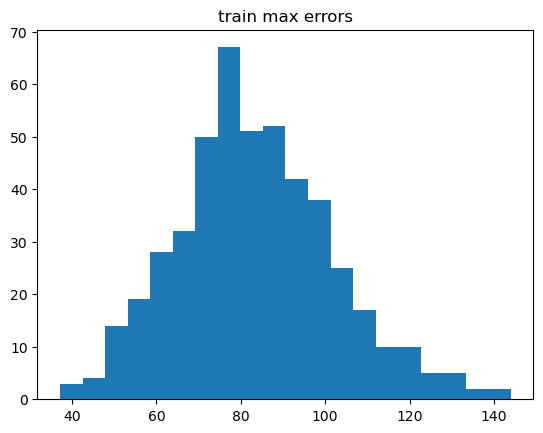

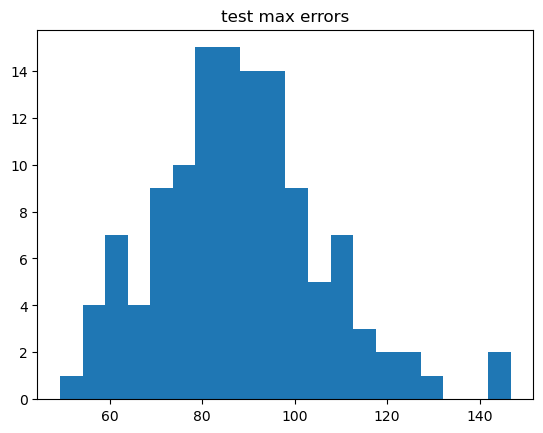

In [15]:
# histogram of max errors
train_max_errors = np.max(np.abs(train_predictions - train_Y), axis=1)
test_max_errors = np.max(np.abs(test_predictions - test_Y), axis=1)
plt.hist(train_max_errors, bins=20)
plt.title('train max errors')
plt.show()
plt.hist(test_max_errors, bins=20)
plt.title('test max errors')
plt.show()

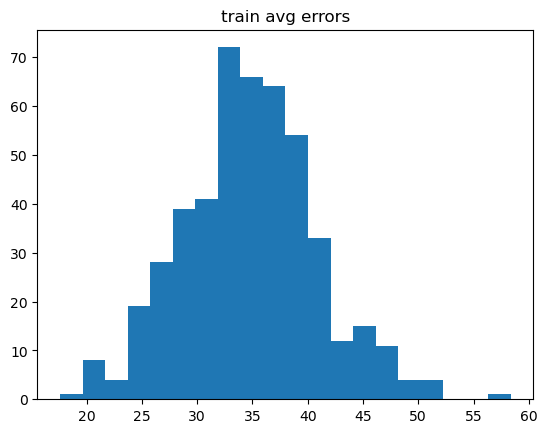

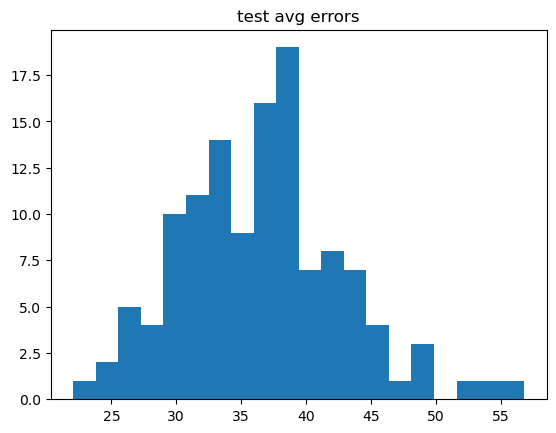

In [16]:
# histogram of avg errors
train_avg_errors = np.mean(np.abs(train_predictions - train_Y), axis=1)
test_avg_errors = np.mean(np.abs(test_predictions - test_Y), axis=1)
plt.hist(train_avg_errors, bins=20)
plt.title('train avg errors')
plt.show()
plt.hist(test_avg_errors, bins=20)
plt.title('test avg errors')
plt.show()

## See worst predictions

In [17]:
from court_segment.plot_court_labels import plot_labels

### Worst max

In [18]:
count = 5
worst_train_indices = np.argsort(train_max_errors)[-count:][::-1]
worst_test_indices = np.argsort(test_max_errors)[-count:][::-1]
print('worst train indices:', worst_train_indices)
print('worst test indices:', worst_test_indices)
print('train max errors:', train_max_errors[worst_train_indices])
print('test max errors:', test_max_errors[worst_test_indices])

worst train indices: [114  92 427 107 103]
worst test indices: [33 25  3 10 39]
train max errors: [144.0102  140.8327  137.53918 134.05896 130.34882]
test max errors: [146.77899  145.71823  129.36652  124.92789  123.233574]


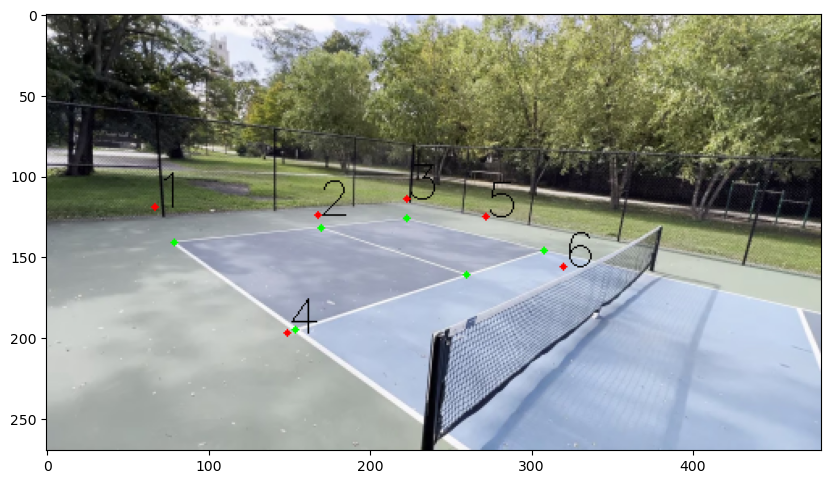

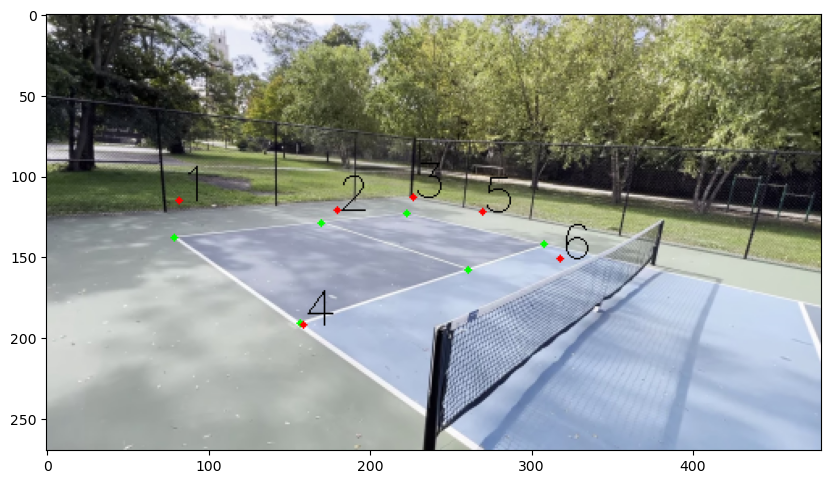

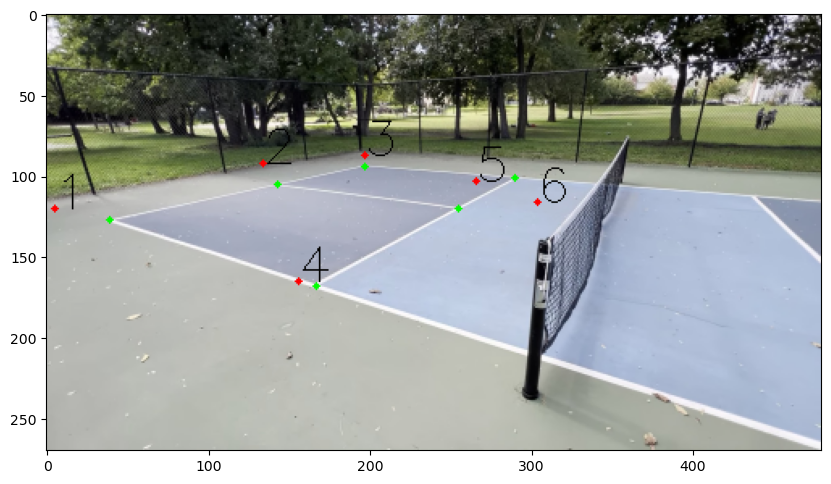

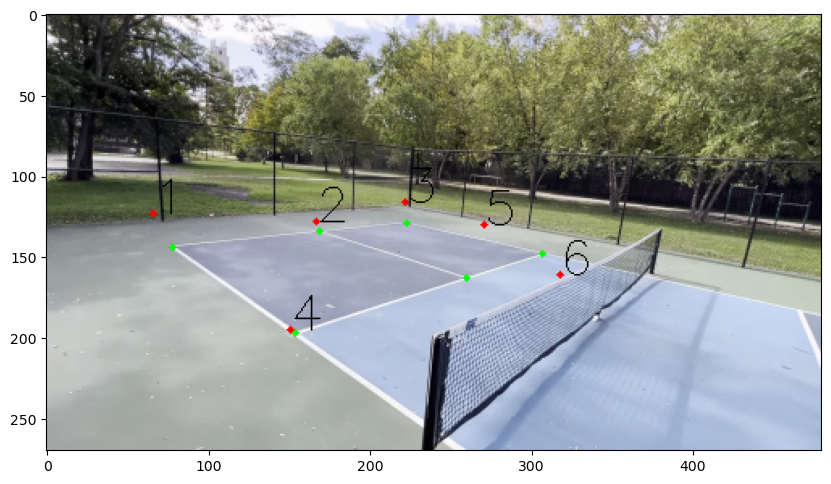

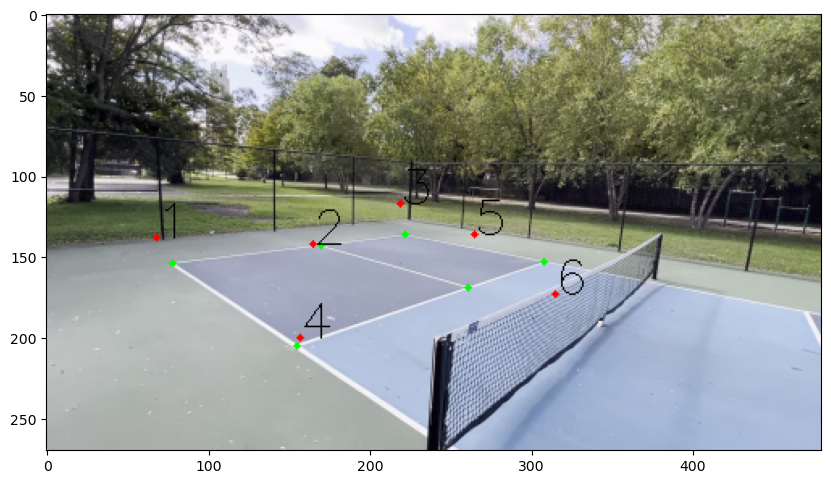

In [19]:
for i in worst_train_indices:
    correct_labels = plot_labels(train_X[i], train_Y[i], withText=False)
    all_labels = plot_labels(correct_labels, train_predictions[i], color=(255, 0,0))
    plot_image(all_labels)

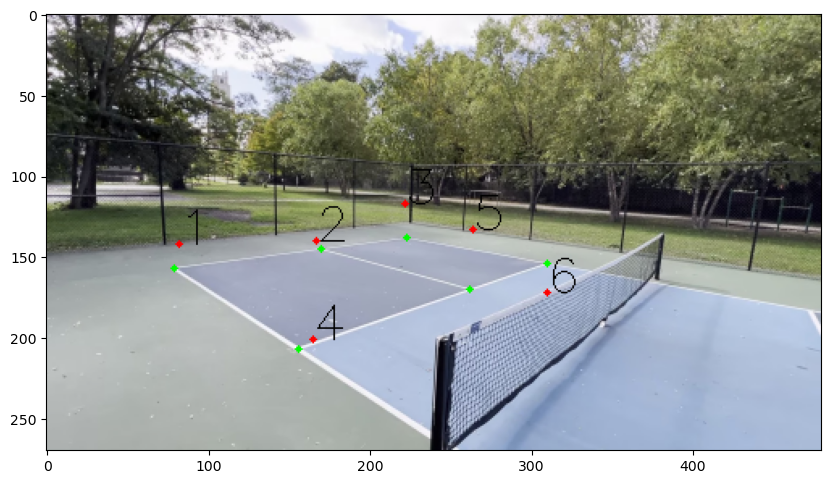

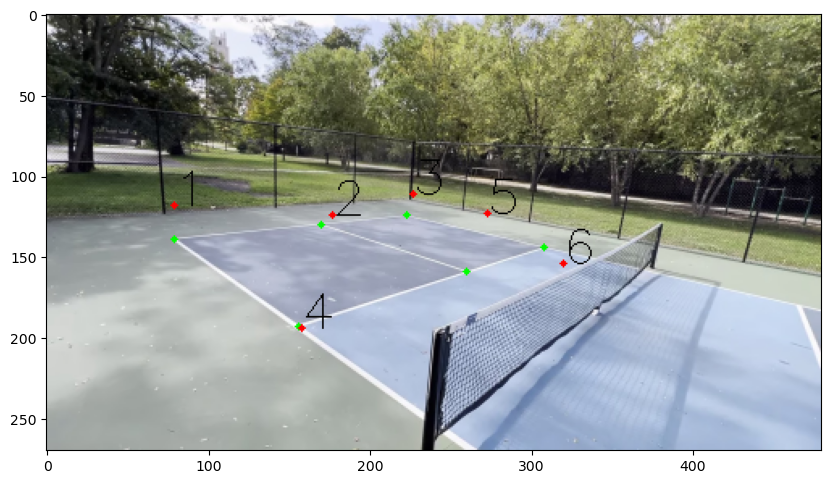

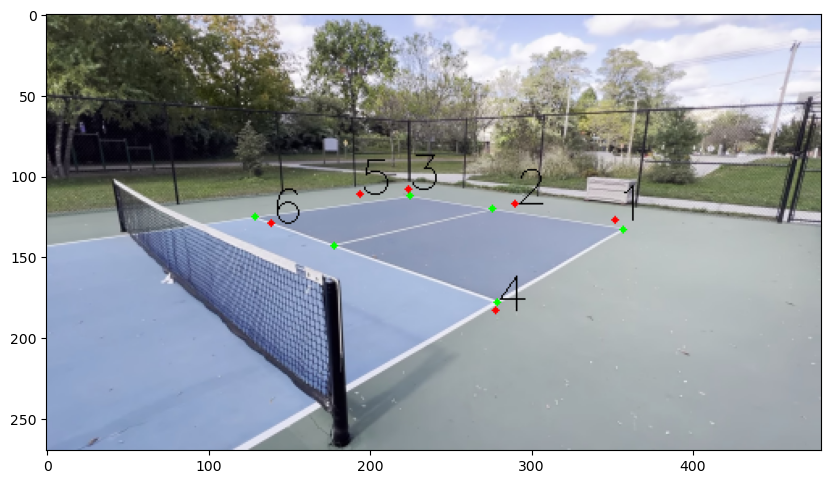

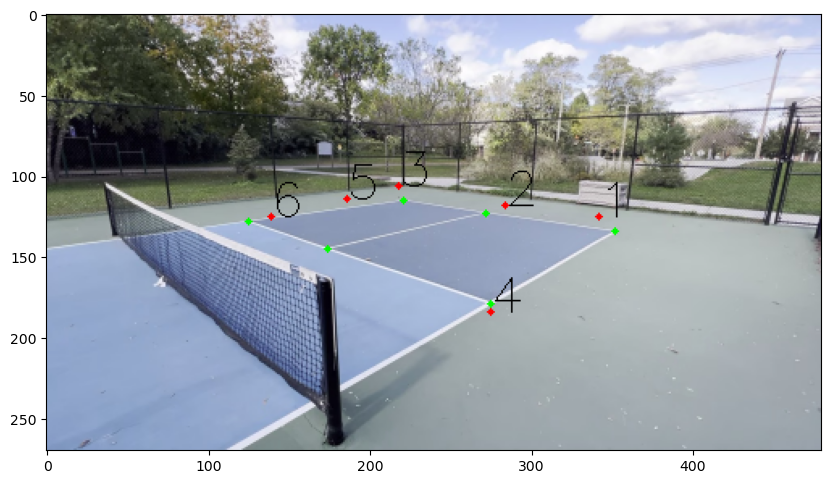

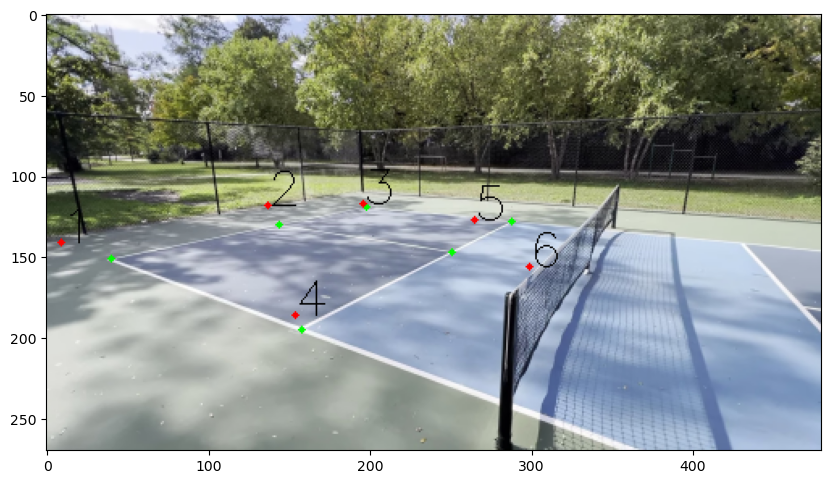

In [20]:
for i in worst_test_indices:
    correct_labels = plot_labels(test_X[i], test_Y[i], withText=False)
    all_labels = plot_labels(correct_labels, test_predictions[i], color=(255,0,0))
    plot_image(all_labels)

### Worst Average

In [21]:
count = 5
worst_train_indices = np.argsort(train_avg_errors)[-count:][::-1]
worst_test_indices = np.argsort(test_avg_errors)[-count:][::-1]
print('worst train indices:', worst_train_indices)
print('worst test indices:', worst_test_indices)
print('train avg errors:', train_avg_errors[worst_train_indices])
print('test avg errors:', test_avg_errors[worst_test_indices])

worst train indices: [244 315 241 283 258]
worst test indices: [ 79 117 118  39  72]
train avg errors: [58.38336  52.224636 51.77623  51.721584 51.007404]
test avg errors: [56.816208 54.97929  52.132862 49.47465  49.059757]


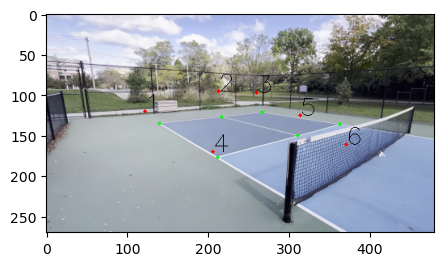

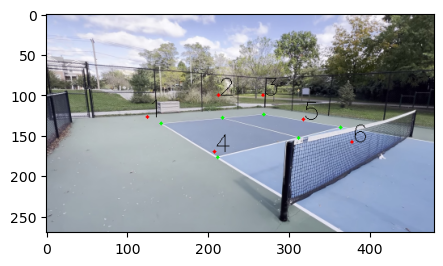

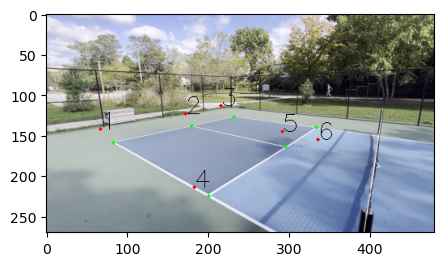

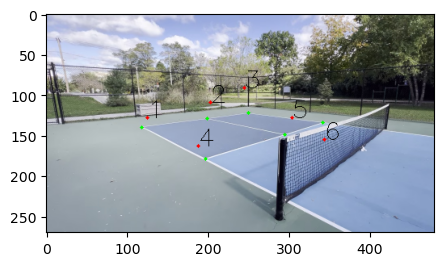

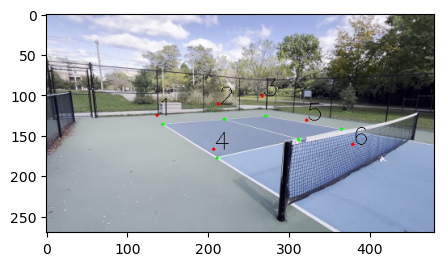

In [22]:
for i in worst_train_indices:
    correct_labels = plot_labels(train_X[i], train_Y[i], withText=False)
    all_labels = plot_labels(correct_labels, train_predictions[i], color=(255,0,0))
    plot_image(all_labels, figsize=(5,5))

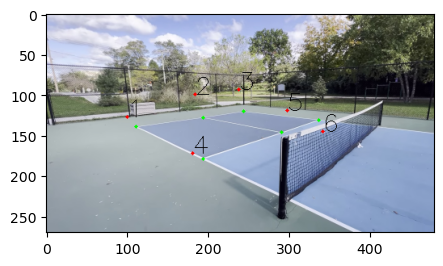

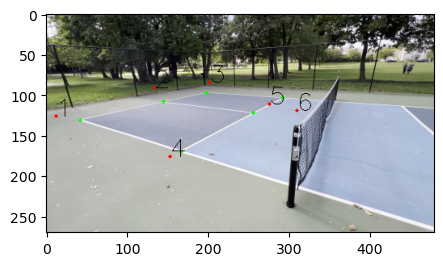

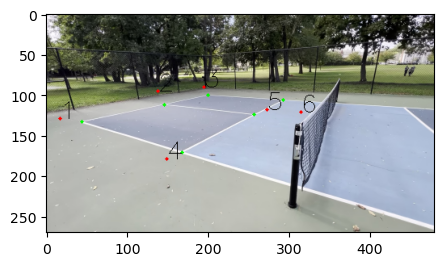

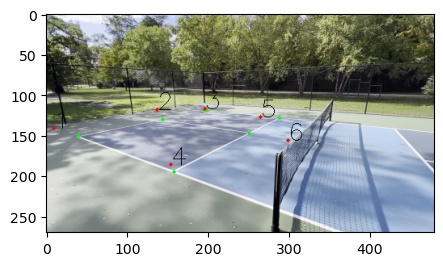

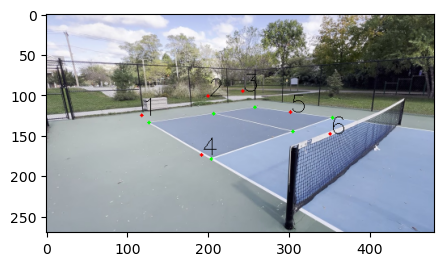

In [23]:
for i in worst_test_indices:
    correct_labels = plot_labels(test_X[i], test_Y[i], withText=False)
    all_labels = plot_labels(correct_labels, test_predictions[i], color=(255,0,0))
    plot_image(all_labels, figsize=(5,5))

## Interactive Testing

In [24]:
from court_segment.plot_court_labels import plot_random_labeled_image

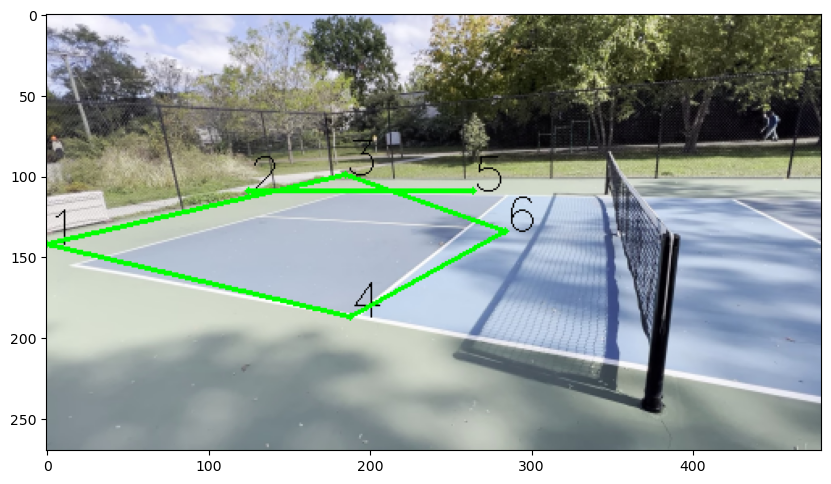

In [83]:
plot_random_labeled_image(train_X, train_predictions, withLines=True)

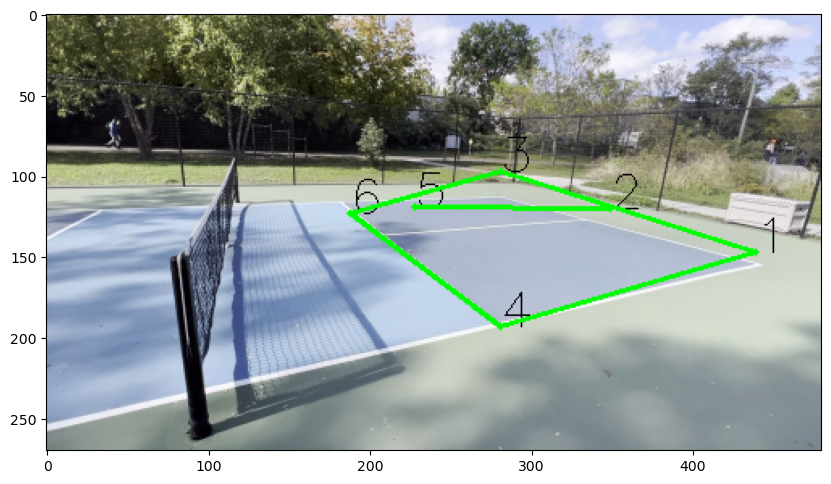

In [26]:
plot_random_labeled_image(test_X, test_predictions, withLines=True)

## Try with new dataset

In [27]:
from tools.image_extract import read_frames
from defs.storage_locs import raw_video_path

In [28]:
frames = [i for i in range(0, 1500, 100)]
vid_path = raw_video_path('court', 'center_left_2_shady.MOV')
X_new = read_frames(vid_path, frames, (480, 270))
X_new.shape

(15, 270, 480, 3)

In [29]:
y_new = model.predict(X_new)
y_new.shape

1/1 [==============================] - 2s 2s/step


(15, 12)

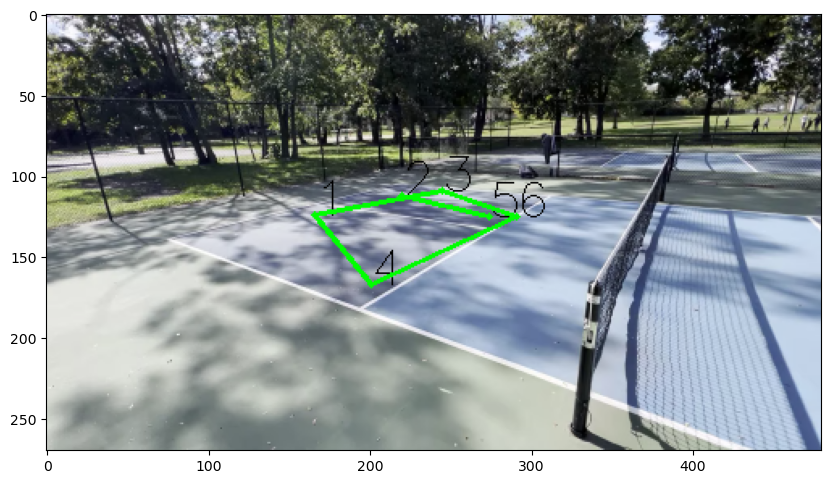

In [30]:
plot_random_labeled_image(X_new, y_new, withLines=True)

horrible...

What about with same dataset but new frames?

In [31]:
frames = [i for i in range(1200, 1500, 50)]
vid_path = raw_video_path('court', 'center_left_1.MOV')
X_new = read_frames(vid_path, frames, (480, 270))
X_new.shape

(6, 270, 480, 3)

In [32]:
y_new = model.predict(X_new)

1/1 [==============================] - 1s 1s/step


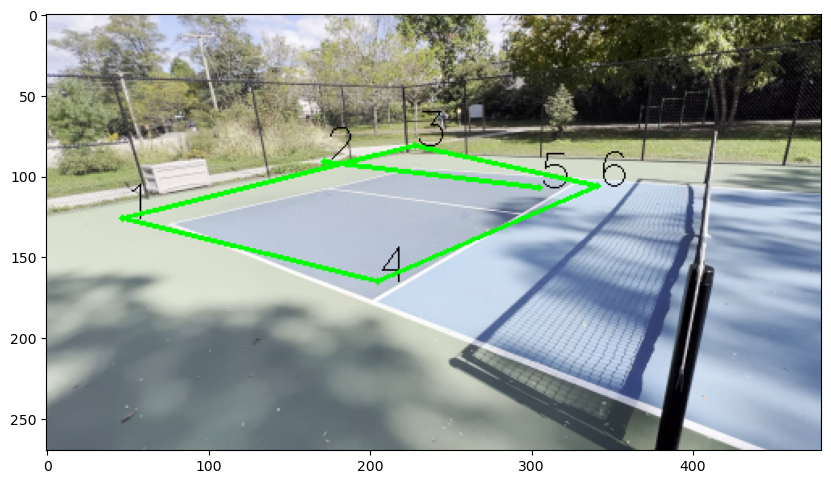

In [89]:
plot_random_labeled_image(X_new, y_new, withLines=True)